In [12]:
import os
import os.path
import json
import glob
import subprocess
import pandas as pd
import random
import torch
import requests
import faiss
import numpy as np
from tqdm import tqdm
from PIL import Image
from transformers import AutoImageProcessor, ViTModel
import matplotlib.pyplot as plt
%matplotlib inline

## Load Discord Data - #meme-shitposting from Blue Politics Discord Server

In [13]:
file_path = "discord/604701560580341771_memes-shitposting.json"
with open(file_path, 'r') as f:
    discord_data = json.load(f)

In [14]:
len(discord_data)

596730

In [15]:
discord_data[-15000]

{'id': '1108748332450451458',
 'content': 'Yes, not necessarily for the same reasons as California, but yes. Also damn good on Alabama for being that high.',
 'author': {'id': '930618671548760065', 'name': 'storyteller76'},
 'pinned': False,
 'ts': '2023-05-18T13:30:02.004+00:00',
 'mentions': [{'id': '674494122093969408',
   'name': 'piggies.go.moo',
   'discriminator': '0000',
   'nickname': '𝘱𝘪𝘨𝘨𝘪𝘦𝘴-𝘨𝘰-𝘮𝘰𝘰 💗🍁⁂',
   'color': '#FF7171',
   'isBot': False,
   'avatarUrl': 'https://cdn.discordapp.com/avatars/674494122093969408/64cef3dc53c9af2ce7117e9ee8b897c2.png?size=512'}],
 'reactions': [],
 'attachments': [],
 'embeds': []}

## Filter data below timestamp

In [18]:
filtered_data = []
for data_dict in tqdm(discord_data):
    timestamp = data_dict['ts'] 
    if timestamp < '2023-06-01':
        filtered_data.append(data_dict)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 596730/596730 [00:00<00:00, 1117923.29it/s]


In [19]:
len(discord_data), len(filtered_data)

(596730, 585035)

## Get Image URLs and Timestamps

In [4]:
attachment_urls = []
ts_arr = []
for item in tqdm(discord_data):
    for attachment in item["attachments"]:
        attachment_urls.append(attachment["url"])
        ts_arr.append(item["ts"])

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 596730/596730 [00:00<00:00, 1799035.69it/s]


In [6]:
len(attachment_urls), len(ts_arr)

(92628, 92628)

In [7]:
attachment_urls[11:13], ts_arr[11:13]

(['https://cdn.discordapp.com/attachments/604701560580341771/604752613610881034/IMG_20190628_165209.jpg',
  'https://cdn.discordapp.com/attachments/604701560580341771/604753110375727134/1557842228696.jpg'],
 ['2019-07-27T19:10:58.845+00:00', '2019-07-27T19:12:57.283+00:00'])

## Inference on Discord Data

In [12]:
index = faiss.read_index('graph/out/imkg_index.index')
index_dict = np.load('graph/out/imkg_img_index_dict.npy', allow_pickle=True).item()
category_index_dict = np.load('graph/out/imkg_img_category_index_dict.npy', allow_pickle=True).item()
url_index_dict = np.load('graph/out/imkg_img_url_index_dict.npy', allow_pickle=True).item()

In [13]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [14]:
processor = AutoImageProcessor.from_pretrained("google/vit-base-patch16-224-in21k")
model = ViTModel.from_pretrained("google/vit-base-patch16-224-in21k").to(device)

In [32]:
test_images = attachment_urls[:10000]
test_ts = ts_arr[:10000]
k = 1
sample_test = []
for i in tqdm(range(len(test_images))):
    try:
        image = Image.open(requests.get(test_images[i], stream=True).raw)
        inputs = processor(images=image, return_tensors="pt")
        inputs = {name: tensor.to(device) for name, tensor in inputs.items()} 
        with torch.no_grad():
            outputs = model(**inputs)
            ftr = outputs.last_hidden_state
        ftr = ftr.reshape(1, -1)
        ftr_np = ftr.detach().cpu().numpy()
        faiss.normalize_L2(ftr_np)
        D, I = index.search(np.expand_dims(ftr_np[0], axis=0), k)
        sample_test.append((test_images[i], url_index_dict[I[0][0]], D, test_ts[i]))
    except:
        pass

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [1:33:34<00:00,  1.78it/s]


In [33]:
len(sample_test)

7182

In [34]:
val1 = [x[0] for x in sample_test]
val2 = [x[1] for x in sample_test]
val3 = [x[2] for x in sample_test]
val4 = [x[3] for x in sample_test]

In [35]:
discord_inference_df = pd.DataFrame(columns=["reddit image", "imkg image", "score", "timestamp"])

In [36]:
for x, y, z, t in tqdm(zip(val1, val2, val3, val4)):
    discord_inference_df.loc[len(discord_inference_df)] = [x, y, z[0][0], t]
    
discord_inference_df.to_csv('./out/discord_inference.csv')

7182it [00:07, 1023.55it/s]


In [37]:
discord_inference_df.head()

,reddit image,imkg image,score,timestamp
0,https://cdn.discordapp.com/attachments/6047015...,https://i.imgflip.com/1ng3cx.jpg,0.258243,2019-07-27T15:50:21.124+00:00
1,https://cdn.discordapp.com/attachments/6047015...,https://i.imgflip.com/13len8.jpg,0.326896,2019-07-27T15:51:17.514+00:00
2,https://cdn.discordapp.com/attachments/6047015...,https://i.imgflip.com/104umf.jpg,0.317084,2019-07-27T15:51:44.933+00:00
3,https://cdn.discordapp.com/attachments/6047015...,https://i.imgflip.com/5jio6l.jpg,0.266104,2019-07-27T16:21:40.343+00:00
4,https://cdn.discordapp.com/attachments/6047015...,https://i.imgflip.com/6e456k.jpg,0.471193,2019-07-27T16:44:13.272+00:00


In [38]:
discord_inference_df.shape

(7182, 4)

## Filter data by score

In [39]:
discord_inference_df = pd.read_csv('./out/discord_inference.csv', index_col=0)

In [40]:
def filter_data(df, filter_score):
    filtered_df = df[df['score']>=filter_score]
    filtered_df.reset_index(drop=True, inplace=True)
    return filtered_df

In [41]:
filter_score = 0.50
filtered_df_50 = filter_data(discord_inference_df, filter_score)
filtered_df_50.to_csv('./out/discord_filtered_df_50.csv')
filtered_df_50.shape

(1094, 4)

In [42]:
filter_score = 0.70
filtered_df_70 = filter_data(discord_inference_df, filter_score)
filtered_df_70.to_csv('./out/discord_filtered_df_70.csv')
filtered_df_70.shape

(145, 4)

In [43]:
filter_score = 0.90
filtered_df_90 = filter_data(discord_inference_df, filter_score)
filtered_df_90.to_csv('./out/discord_filtered_df_90.csv')
filtered_df_90.shape

(4, 4)

## Plot filtered data - potential match

In [44]:
def plot_match_data(max_len, images1, images2):
    nrows, ncols = min(10, max_len), 2
    fig, axes = plt.subplots(nrows, ncols, figsize=(20, 50))
    image1, image2 = "", "" 
    for i in range(min(10, max_len)):
        image1 = Image.open(requests.get(images1[i], stream=True).raw)
        axes[i, 0].imshow(image1)
        axes[i, 0].axis('off')
        image2 = Image.open(requests.get(images2[i], stream=True).raw)
        axes[i, 1].imshow(image2)
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

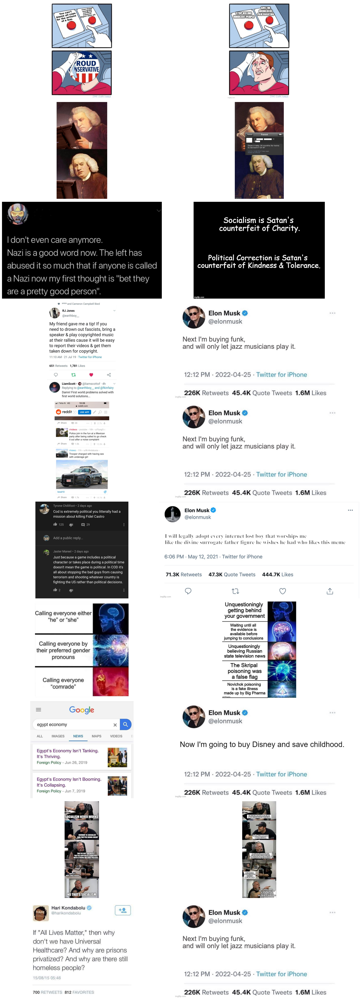

In [48]:
filtered_df = pd.read_csv('./out/discord_filtered_df_50.csv')
images1 = list(filtered_df['reddit image'].values)
images2 = list(filtered_df['imkg image'].values)
plot_match_data(len(filtered_df), images1, images2)

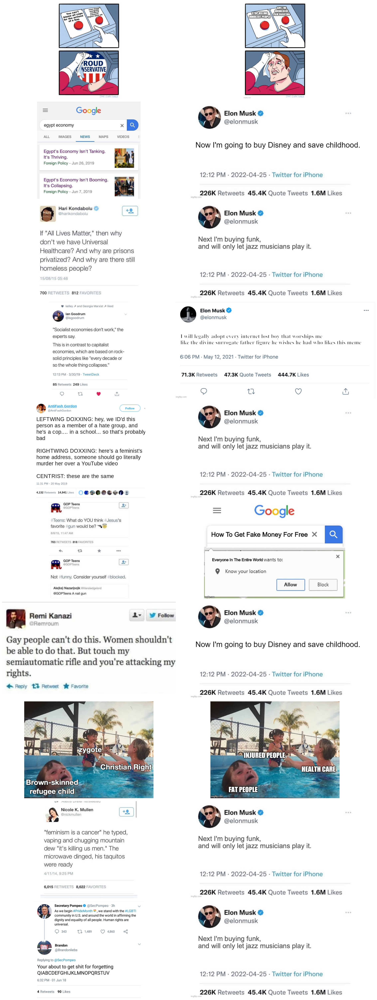

In [49]:
filtered_df = pd.read_csv('./out/discord_filtered_df_70.csv')
images1 = list(filtered_df['reddit image'].values)
images2 = list(filtered_df['imkg image'].values)
plot_match_data(len(filtered_df), images1, images2)

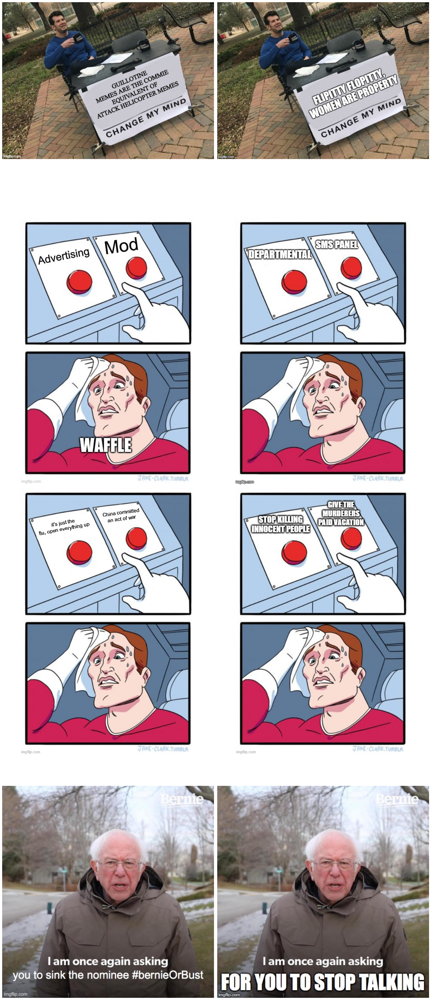

In [50]:
filtered_df = pd.read_csv('./out/discord_filtered_df_90.csv')
images1 = list(filtered_df['reddit image'].values)
images2 = list(filtered_df['imkg image'].values)
plot_match_data(len(filtered_df), images1, images2)